In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from pathlib import Path

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

Device: cpu


# ---------- Load cached embeddings ----------


In [3]:
PROJECT_DIR = Path("./data") 
EMBEDDINGS_FILE = PROJECT_DIR / "image_embeddings.npz"  

data = np.load(EMBEDDINGS_FILE, allow_pickle=True)
image_names = list(data["image_names"])
X = data["embeddings"].astype(np.float32) 

# L2 normalize embeddings
X = X / (np.linalg.norm(X, axis=1, keepdims=True) + 1e-8)

N, D = X.shape
print("Loaded embeddings:", (N, D))

Loaded embeddings: (300, 512)


In [4]:
class EmbeddingDataset(Dataset):
    def __init__(self, X_np: np.ndarray):
        self.X = torch.from_numpy(X_np)

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        return self.X[idx]

ds = EmbeddingDataset(X)

# ---------- Train/val ----------


In [5]:
val_frac = 0.1
n_val = int(len(ds) * val_frac)
n_train = len(ds) - n_val
train_ds, val_ds = random_split(ds, [n_train, n_val], generator=torch.Generator().manual_seed(42))

batch_size = 128
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, drop_last=False)


In [6]:
# Autoencoder
class MLPAutoencoder(nn.Module):
    def __init__(self, input_dim: int, latent_dim: int = 64, hidden_dim: int = 256):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, latent_dim),
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, input_dim),
        )

    def encode(self, x):
        return self.encoder(x)

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        z = self.encode(x)
        x_hat = self.decode(z)
        return x_hat, z
    

In [7]:
latent_dim = 64
ae = MLPAutoencoder(input_dim=D, latent_dim=latent_dim, hidden_dim=256).to(device)
opt = torch.optim.Adam(ae.parameters(), lr=1e-3)
criterion = nn.MSELoss()
epochs = 20

def run_epoch(loader, train: bool):
    ae.train(train)
    total_loss = 0.0
    n = 0
    for x in loader:
        x = x.to(device)
        if train:
            opt.zero_grad(set_to_none=True)

        x_hat, _ = ae(x)

        # MSE reconstruction; optional: encourage direction preservation with cosine
        loss = F.mse_loss(x_hat, x)

        if train:
            loss.backward()
            opt.step()

        total_loss += loss.item() * x.size(0)
        n += x.size(0)
    return total_loss / max(n, 1)

In [8]:
for ep in range(1, epochs + 1):
    train_loss = run_epoch(train_loader, train=True)
    val_loss = run_epoch(val_loader, train=False)
    print(f"Epoch {ep:02d}/{epochs} | train {train_loss:.6f} | val {val_loss:.6f}")

# ---------- Save model ----------
OUT_DIR = Path("./models")
output_aes = OUT_DIR / "autoencoder"
output_aes.mkdir(exist_ok=True)

torch.save(
    {
        "state_dict": ae.state_dict(),
        "input_dim": D,
        "latent_dim": latent_dim,
    },
    output_aes / "ae.pt",
)
print("Saved:", output_aes / "ae.pt")

Epoch 01/20 | train 0.003674 | val 0.002274
Epoch 02/20 | train 0.002116 | val 0.001615
Epoch 03/20 | train 0.001594 | val 0.001418
Epoch 04/20 | train 0.001425 | val 0.001276
Epoch 05/20 | train 0.001289 | val 0.001171
Epoch 06/20 | train 0.001193 | val 0.001098
Epoch 07/20 | train 0.001123 | val 0.001033
Epoch 08/20 | train 0.001062 | val 0.000973
Epoch 09/20 | train 0.001010 | val 0.000924
Epoch 10/20 | train 0.000972 | val 0.000900
Epoch 11/20 | train 0.000953 | val 0.000888
Epoch 12/20 | train 0.000940 | val 0.000876
Epoch 13/20 | train 0.000925 | val 0.000859
Epoch 14/20 | train 0.000909 | val 0.000848
Epoch 15/20 | train 0.000893 | val 0.000835
Epoch 16/20 | train 0.000871 | val 0.000819
Epoch 17/20 | train 0.000848 | val 0.000799
Epoch 18/20 | train 0.000826 | val 0.000776
Epoch 19/20 | train 0.000805 | val 0.000756
Epoch 20/20 | train 0.000786 | val 0.000743
Saved: models/autoencoder/ae.pt


load AE → reconstruct

In [9]:
def load_autoencoder(ckpt_path: Path) -> MLPAutoencoder:
    ckpt = torch.load(ckpt_path, map_location="cpu")
    ae = MLPAutoencoder(
        input_dim=int(ckpt["input_dim"]),
        latent_dim=int(ckpt["latent_dim"]),
        hidden_dim=256,  # must match training
    )
    ae.load_state_dict(ckpt["state_dict"])
    ae.to(device).eval()
    return ae

This code checks whether the autoencoder can compress CLIP embeddings into a smaller space while preserving their semantic meaning, and it gives us the latent representations we use for concept teaching experiments.

In [10]:
@torch.no_grad()
def reconstruct_embeddings(ae: MLPAutoencoder, X_np: np.ndarray, batch_size: int = 512):
    """
    X_np: (N, D) float32, preferably L2-normalized (CLIP style).
    Returns:
      X_hat: (N, D) reconstructed embeddings
      Z: (N, latent_dim) latent embeddings
      metrics: dict with mse and mean cosine(x_hat, x)
    """
    X_hat_list, Z_list = [], []
    mse_sum, cos_sum, n = 0.0, 0.0, 0

    for i in range(0, len(X_np), batch_size):
        x = torch.from_numpy(X_np[i:i+batch_size]).to(device)
        x_hat, z = ae(x)

        # Track metrics
        mse = F.mse_loss(x_hat, x, reduction="sum").item()
        cos = F.cosine_similarity(
            F.normalize(x_hat, dim=1),
            F.normalize(x, dim=1),
            dim=1
        ).sum().item()

        mse_sum += mse
        cos_sum += cos
        n += x.size(0)

        X_hat_list.append(x_hat.cpu().numpy())
        Z_list.append(z.cpu().numpy())

    X_hat = np.vstack(X_hat_list).astype(np.float32)
    Z = np.vstack(Z_list).astype(np.float32)

    metrics = {
        "mse": mse_sum / max(n, 1),
        "mean_cosine": cos_sum / max(n, 1),
    }
    return X_hat, Z, metrics



EMBEDDINGS_FILE = PROJECT_DIR / "image_embeddings.npz"  
AE_CKPT = OUT_DIR / "autoencoder" / "ae.pt"
OUT_FILE = OUT_DIR / "autoencoder" / "reconstructions.npz"

data = np.load(EMBEDDINGS_FILE, allow_pickle=True)
image_names = data["image_names"]
X = data["embeddings"].astype(np.float32)

# If your pipeline already normalized, you can remove this.
X = X / (np.linalg.norm(X, axis=1, keepdims=True) + 1e-8)

ae = load_autoencoder(AE_CKPT)
X_hat, Z, metrics = reconstruct_embeddings(ae, X)

print("Reconstruction metrics:", metrics)

np.savez(
    OUT_FILE,
    image_names=image_names,
    embeddings=X,           # original
    embeddings_hat=X_hat,   # reconstructed
    latents=Z,              # latent vectors
)
print("Saved reconstructions to:", OUT_FILE)

Reconstruction metrics: {'mse': 0.39291089375813804, 'mean_cosine': 0.7768008422851562}
Saved reconstructions to: models/autoencoder/reconstructions.npz


# latent retrieval

In [11]:
@torch.no_grad()
def encode_all_images(ae, X_np, batch_size=512):
    ae.eval()
    Z = []
    for i in range(0, len(X_np), batch_size):
        x = torch.from_numpy(X_np[i:i+batch_size]).to(device)
        z = ae.encode(x)
        z = F.normalize(z, dim=1)  # normalize for cosine in latent
        Z.append(z.cpu().numpy())
    return np.vstack(Z)

@torch.no_grad()
def encode_query(ae, q_np):
    # q_np: (D,) float32, already L2-normalized in CLIP space
    ae.eval()
    q = torch.from_numpy(q_np.astype(np.float32)).to(device).unsqueeze(0)
    zq = ae.encode(q)
    zq = F.normalize(zq, dim=1)
    return zq.squeeze(0).cpu().numpy()

def topk_cosine(zq, Z, k=10):
    # both normalized -> dot product = cosine
    sims = Z @ zq
    idx = np.argsort(-sims)[:k]
    return idx, sims[idx]

# Precompute image latents once
Z_images = encode_all_images(ae, X)


# Interpret individual latent units (Extremes)

This section helps you *see what a latent dimension captures* by showing the images with the lowest vs highest values along that dimension.


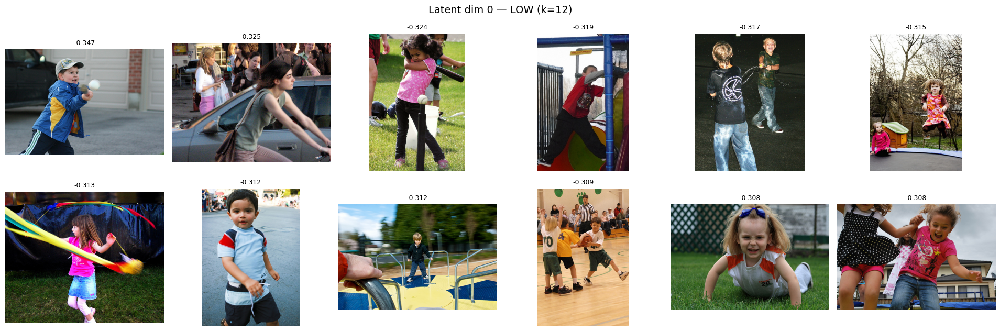

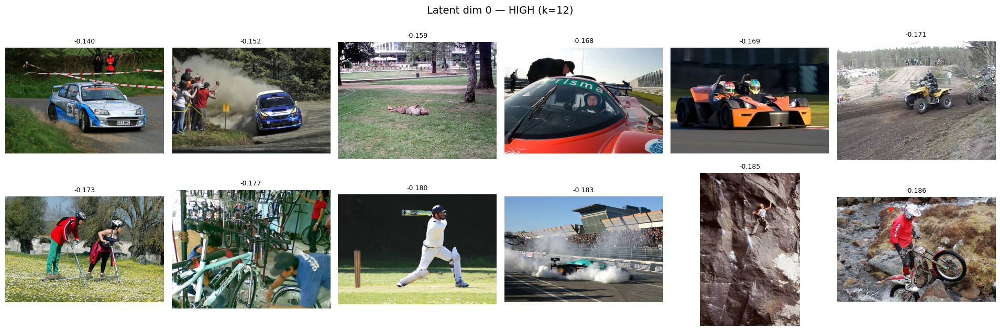

Top dims by variance: [45, 41, 17, 21]


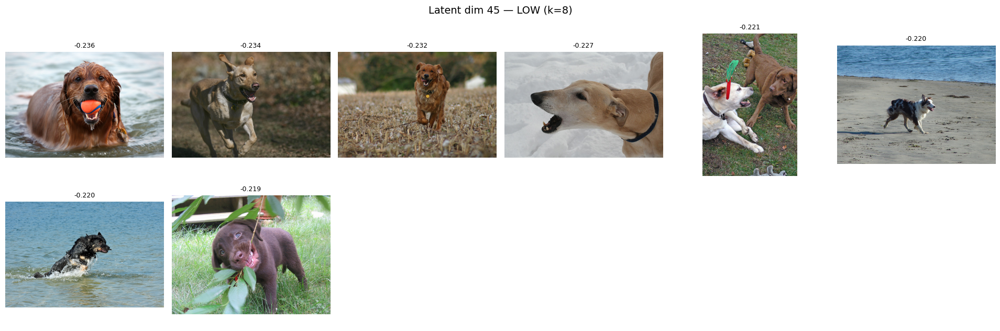

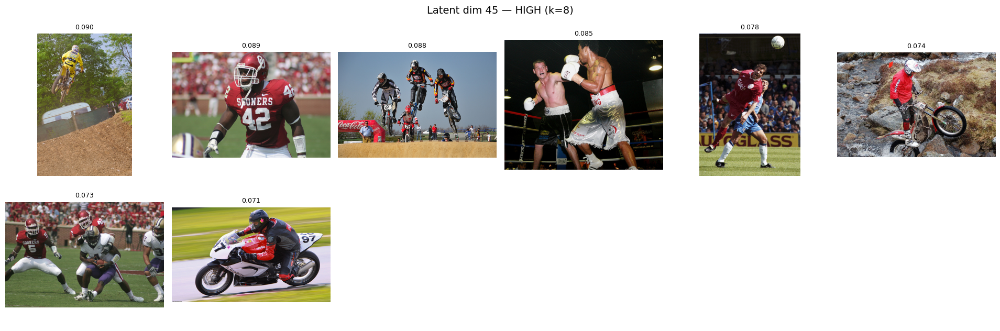

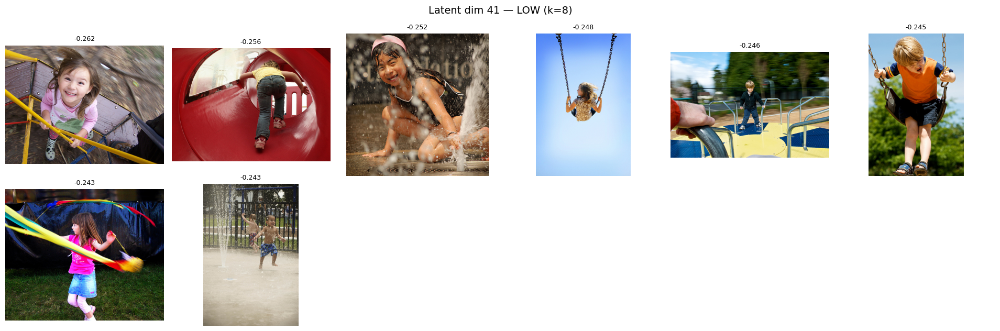

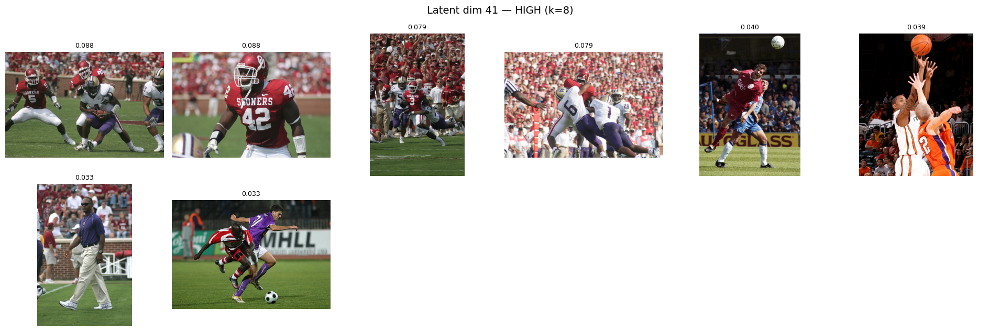

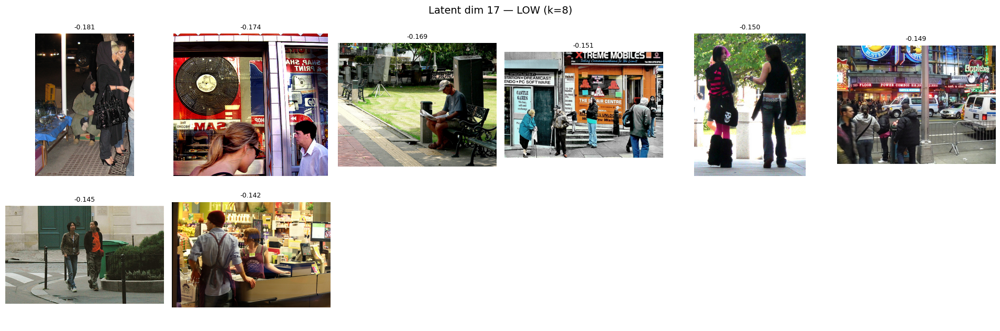

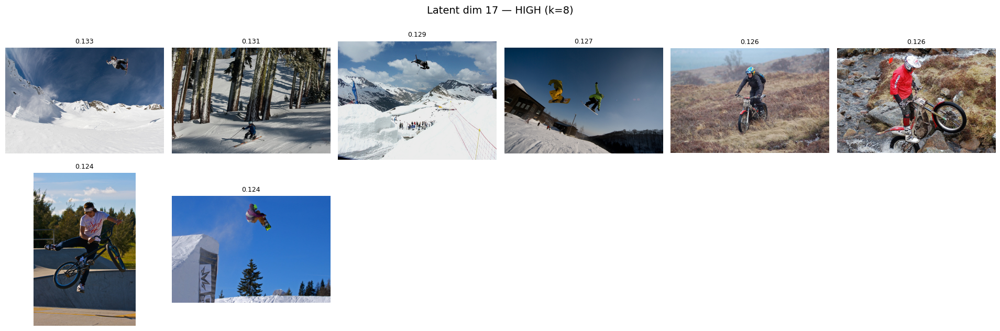

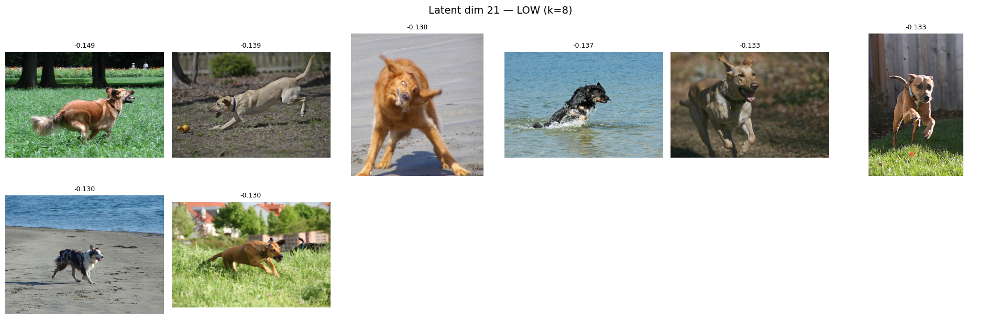

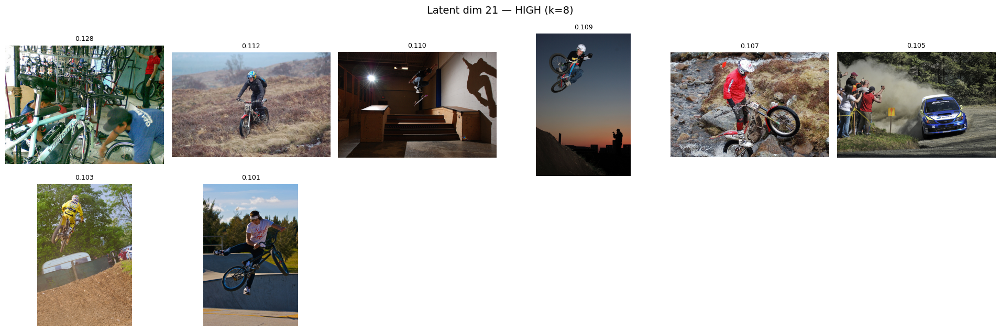

In [14]:

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

def _get_latents_and_names():
    '''
    Tries to find (Z, image_names) in the current notebook namespace.
    Falls back to loading from reconstructions.npz if present.
    '''
    # Prefer in-memory variables if they exist
    if "Z" in globals() and isinstance(globals()["Z"], np.ndarray):
        Z_local = globals()["Z"]
        names_local = globals().get("image_names", None)
        return Z_local, names_local

    if "Z_images" in globals() and isinstance(globals()["Z_images"], np.ndarray):
        Z_local = globals()["Z_images"]
        names_local = globals().get("image_names", None)
        return Z_local, names_local

    # Fallback: try loading reconstructions.npz
    candidates = [
        Path("autoencoder") / "reconstructions.npz",
        Path("results") / "autoencoder" / "reconstructions.npz",
        Path("autoencoder") / "reconstructions_celeba.npz",
    ]
    for p in candidates:
        if p.exists():
            d = np.load(p, allow_pickle=True)
            Z_local = d["latents"].astype(np.float32)
            names_local = list(d["image_names"])
            print(f"Loaded latents from: {p}")
            return Z_local, names_local

    raise FileNotFoundError(
        "Couldn't find latents. Expected a numpy array named `Z` or `Z_images`, "
        "or a file like autoencoder/reconstructions.npz containing key `latents`."
    )

def _get_image_dir():
    '''
    Tries to infer the image directory variable from the notebook.
    '''
    for key in ["CELEBA_SUBSET_DIR", "IMAGE_DIR", "image_dir"]:
        if key in globals():
            return Path(globals()[key])
    # Fallback: common local paths
    for p in [Path("data/images"), Path("data/celeba_subset"), Path("celeba_subset")]:
        if p.exists():
            return p
    raise ValueError(
        "Couldn't infer image directory. Please define `CELEBA_SUBSET_DIR` (or IMAGE_DIR) "
        "pointing to the folder that contains the image files."
    )

def show_image_grid(image_names, image_dir, title=None, scores=None, cols=6, figsize_scale=3.2):
    '''
    Lightweight image grid with optional score captions.
    '''
    n = len(image_names)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * figsize_scale, rows * figsize_scale))
    axes = np.array(axes).reshape(-1)

    if title:
        fig.suptitle(title, fontsize=14)

    for i, name in enumerate(image_names):
        ax = axes[i]
        img_path = Path(image_dir) / name
        if img_path.exists():
            ax.imshow(Image.open(img_path))
        else:
            ax.text(0.5, 0.5, f"Missing:\n{name}", ha="center", va="center")
        ax.axis("off")
        if scores is not None:
            ax.set_title(f"{scores[i]:.3f}", fontsize=9)

    for j in range(n, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

def latent_extremes_indices(Z, dim_idx, k=12):
    '''
    Returns indices of the k lowest and k highest examples along latent dimension dim_idx.
    '''
    if dim_idx < 0 or dim_idx >= Z.shape[1]:
        raise ValueError(f"dim_idx={dim_idx} out of bounds for Z with shape {Z.shape}")
    order = np.argsort(Z[:, dim_idx])
    low = order[:k]
    high = order[-k:][::-1]
    return low, high

def visualize_latent_unit_extremes(dim_idx, k=12):
    '''
    Shows two grids: LOW and HIGH extremes for a latent unit.
    '''
    Z, names = _get_latents_and_names()
    image_dir = _get_image_dir()

    if names is None:
        # If names weren't available in memory, try loading from embeddings file if present
        if "EMBEDDINGS_FILE" in globals() and Path(globals()["EMBEDDINGS_FILE"]).exists():
            d = np.load(globals()["EMBEDDINGS_FILE"], allow_pickle=True)
            names = list(d["image_names"])
        else:
            raise ValueError(
                "Couldn't find `image_names`. Please ensure `image_names` exists, "
                "or that your embeddings/reconstructions file stores it."
            )

    low_idx, high_idx = latent_extremes_indices(Z, dim_idx=dim_idx, k=k)
    low_imgs = [names[i] for i in low_idx]
    high_imgs = [names[i] for i in high_idx]

    # Captions: actual latent values for those images
    low_scores = Z[low_idx, dim_idx]
    high_scores = Z[high_idx, dim_idx]

    show_image_grid(low_imgs, "./data/images_subset", title=f"Latent dim {dim_idx} — LOW (k={k})", scores=low_scores, cols=6)
    show_image_grid(high_imgs, "./data/images_subset", title=f"Latent dim {dim_idx} — HIGH (k={k})", scores=high_scores, cols=6)

def scan_latent_units(k=8, top_units=6):
    '''
    Quick helper: find latent dimensions with highest variance and visualize them.
    Good for picking 'interesting' units.
    '''
    Z, _ = _get_latents_and_names()
    variances = np.var(Z, axis=0)
    dims = np.argsort(-variances)[:top_units]
    print("Top dims by variance:", dims.tolist())
    for d in dims:
        visualize_latent_unit_extremes(d, k=k)

# ---- Suggested usage ----
visualize_latent_unit_extremes(dim_idx=0, k=12)
scan_latent_units(k=8, top_units=4)
